## Model for outcome 6 months after the (first) stroke

In [1]:
# general
import pandas as pd
import numpy as np
from functions import modeling_14d

# plot libarys
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

# Model preparation
#import imblearn
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV, cross_validate
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler, StandardScaler, LabelEncoder, OrdinalEncoder
from sklearn.compose import ColumnTransformer, make_column_selector

from sklearn.dummy import DummyClassifier
 

# Classifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier, export_graphviz  
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from xgboost import XGBClassifier

## Cluster and Dimension Reduction
from kneed import KneeLocator
from sklearn.cluster import DBSCAN, MiniBatchKMeans, KMeans, AgglomerativeClustering
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

# Model Metrics
from sklearn.metrics import precision_score, recall_score, roc_auc_score, roc_curve, confusion_matrix, classification_report, plot_confusion_matrix
from sklearn.metrics import f1_score, make_scorer, adjusted_rand_score, precision_recall_curve

# Tensorflow
import os
import tensorflow as tf
from tensorboard.plugins import projector

# for merging the dataframes
import os, glob
import json

# further libarys
#import itertools
from sklearn.tree import export_graphviz
from collections import Counter

%matplotlib inline

In [2]:
#df = pd.read_csv('data/IST_corrected_model.csv',  index_col= [0])

In [3]:
df = pd.read_csv('data/IST_corrected_clean.csv',  index_col= [0])

In [4]:
# Only keep patients with an ischaemic stroke => df['DDIAGISC'].eq('Y')
#df = df[df['DDIAGISC'].eq('Y')]

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17692 entries, 0 to 19434
Columns: 115 entries, HOSPNUM to DEAD
dtypes: float64(16), int64(29), object(70)
memory usage: 15.7+ MB


In [6]:
df.index = pd.RangeIndex(len(df.index))

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17692 entries, 0 to 17691
Columns: 115 entries, HOSPNUM to DEAD
dtypes: float64(16), int64(29), object(70)
memory usage: 15.5+ MB


## Define Target


After two weeks, we want to predict the recovery of patients after 6 months. Thus, we can exclude patients that have died within 14 days after their stroke.

In [8]:
df = df[df['DDEAD'] != 'Y']

There are two variables that contain the information on recovery of patients. One is 'FRECOVER', the other - and more detailed - is 'OCCODE'. Let's compare the variables:

In [9]:
r_group = df.groupby('FRECOVER')
r_group.OCCODE.value_counts()

FRECOVER  OCCODE       
N         Dependent        6593
          Not recovered    3562
          Dead                1
Y         Recovered        2999
          Dependent         374
Name: OCCODE, dtype: int64

The variables are not identical when looking at "recovered". Patients who are labeled as recovered in 'FRECOVER' and as dependent in 'OCCODE'. For the models we are going to use the more conservative approach and use 'OCCODE'. 

In [10]:
df.OCCODE.value_counts()

Dependent        7091
Not recovered    3562
Recovered        2999
Dead             2095
Name: OCCODE, dtype: int64

In [11]:
print(f'Patients recovered: {round((df.OCCODE.value_counts()[2] / df.shape[0] * 100),1)} %')
print(f'Patients not recovered: {round((df.OCCODE.value_counts()[1] / df.shape[0] * 100),1)} %')
print(f'Patients dependent: {round((df.OCCODE.value_counts()[0] / df.shape[0] * 100),1)} %')
print(f'Patients deceased: {round((df.OCCODE.value_counts()[3] / df.shape[0] * 100),1)} %')

Patients recovered: 19.0 %
Patients not recovered: 22.6 %
Patients dependent: 45.0 %
Patients deceased: 13.3 %


We generate a new target column with 0 for recovered patients and 1 for all other outcomes.

In [12]:
def target(row):
    if row.OCCODE == 'Recovered':
        return 0
    elif row.OCCODE in ['Not recovered', 'Dependent', 'Dead']:
        return 1
    else:
        return np.nan

In [13]:
# Create the new target column
df['RECO'] = df.apply(lambda row: target(row), axis=1)

In [13]:
df.RECO.isnull().sum()

0

In [14]:
df.RECO.value_counts() / df.shape[0]

1    0.809551
0    0.190449
Name: RECO, dtype: float64

The intent of the model is to be able to differentiate between 'recovered' and all other outcomes ('not recovered', 'dependent' and 'dead'). We have a slightly imbalanced dataset. Neither oversampling nor undersampling improved the models below. So we are going to use the data as is.

## Select features

For the prediction of the models we are going to use the variables for age, sex, blood pressure, possible deficits (e.g. arm/hand deficit, foot/leg deficit and such), indicator for non-cerebral bleeds as well as the indicator for any stroke, both within 14 days. 

Other variables were included in the first runs of the models (such as type of stroke), but were excluded as they did not improve the models and we aimed at building simple models. 

In [14]:
# Select features
features = ['SEX', 'AGE', 'RSBP', 'RDEF1', 'RDEF2', 'RDEF3', 'RDEF4', 'RDEF5', 'RDEF6', 'RDEF7', 'NCB14', 'STRK14']
X = df[features]

# Select target RECO
y = df.RECO

In [15]:
print(sorted(Counter(y).items()))

[(0, 2999), (1, 12748)]


In [16]:
# Split the data in test and training set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [17]:
#convert all 'objects' into 'categories'
X_train = pd.concat([
        X_train.select_dtypes([], ['object']),
        X_train.select_dtypes(['object']).apply(pd.Series.astype, dtype='category')
        ], axis=1).reindex(X_train.columns, axis=1)
X_train.index = pd.RangeIndex(len(X_train.index))

In [18]:
#convert all 'objects' into 'categories'
X_test = pd.concat([
        X_test.select_dtypes([], ['object']),
        X_test.select_dtypes(['object']).apply(pd.Series.astype, dtype='category')
        ], axis=1).reindex(X_test.columns, axis=1)
X_test.index = pd.RangeIndex(len(X_test.index))

In [19]:
y_train.index = pd.RangeIndex(len(y_train.index))
y_test.index = pd.RangeIndex(len(y_test.index))

### Preparation of Data Scaling and Category Encoding
Some models need scaling of numerical features and encoding of categorical features. The sklearn preprocessors are instantiated here and used where necessary in the data transformation step of each model.

In [20]:
# encoder for categories
onehot = OneHotEncoder(drop="first")

# scalers for numerical features
mms = MinMaxScaler()
ss = StandardScaler()

# Prepare list of numerical and categorical columns
num_cols = make_column_selector(dtype_include=np.number)
cat_cols = make_column_selector(dtype_include='category')

## Dummy classifier


The baseline model was generated by implemented the dummy classifier from sklearn. We get a score of 81%, which needs to be beaten by the final model.

--- MODEL PARAMETERS ----------
{
    "constant": null,
    "random_state": 42,
    "strategy": "most_frequent"
}
--- F1-Score ----------
0.8961569910057237
--- CLASSIFICATION REPORT ----------
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       889
           1       0.81      1.00      0.90      3836

    accuracy                           0.81      4725
   macro avg       0.41      0.50      0.45      4725
weighted avg       0.66      0.81      0.73      4725

--- CONFUSION MATRIX ----------
[[   0  889]
 [   0 3836]]
/Users/Nicole/Documents/Data_Science/neuefische/projects/Capstone/stroke/Capstone/.venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/Nicole/Documents/Data_Sci

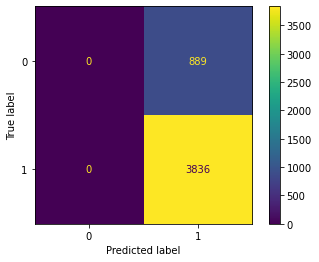

In [23]:
clf_dummy = DummyClassifier(strategy='most_frequent', random_state=42)
m_dummy = modeling_14d.pred_eval_plot_model(X_train, X_test, y_train, y_test, clf_dummy)

With the dummy classifier all get predicted as 'not recovered'. This results in a accuracy of 81%, but it does not predict recovered patients at all.

## Logistic Regression with Standard Scaler


In [24]:
# Define transformer
transformer = ColumnTransformer([
    ("scale", ss, num_cols),
    ("encode", onehot, cat_cols),
])

# Transform
X_train_trans = transformer.fit_transform(X_train)
X_test_trans = transformer.transform(X_test)

--- MODEL PARAMETERS ----------
{
    "C": 1.0,
    "class_weight": null,
    "dual": false,
    "fit_intercept": true,
    "intercept_scaling": 1,
    "l1_ratio": null,
    "max_iter": 400,
    "multi_class": "auto",
    "n_jobs": null,
    "penalty": "l2",
    "random_state": null,
    "solver": "lbfgs",
    "tol": 0.0001,
    "verbose": 0,
    "warm_start": false
}
--- F1-Score ----------
0.8940843074743181
--- CLASSIFICATION REPORT ----------
              precision    recall  f1-score   support

           0       0.46      0.05      0.09       889
           1       0.82      0.99      0.89      3836

    accuracy                           0.81      4725
   macro avg       0.64      0.52      0.49      4725
weighted avg       0.75      0.81      0.74      4725

--- CONFUSION MATRIX ----------
[[  42  847]
 [  50 3786]]


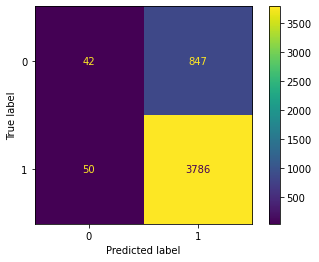

In [25]:
logreg_ss = LogisticRegression(max_iter=400)
m_logreg_ss = modeling_14d.pred_eval_plot_model(X_train_trans, X_test_trans, y_train, y_test, logreg_ss)

In [26]:
# Classification report
y_probs = m_logreg_ss.predict_proba(X_test_trans)[:, 1]

y_pred = y_probs > 0.1
print(f"--- CLASSIFICATION REPORT {'-'*10}")
print(classification_report(y_test,y_pred))
print(f"--- CONFUSION MATRIX {'-'*10}")
print(confusion_matrix(y_test,y_pred))

--- CLASSIFICATION REPORT ----------
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       889
           1       0.81      1.00      0.90      3836

    accuracy                           0.81      4725
   macro avg       0.41      0.50      0.45      4725
weighted avg       0.66      0.81      0.73      4725

--- CONFUSION MATRIX ----------
[[   0  889]
 [   0 3836]]
/Users/Nicole/Documents/Data_Science/neuefische/projects/Capstone/stroke/Capstone/.venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/Nicole/Documents/Data_Science/neuefische/projects/Capstone/stroke/Capstone/.venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precisio

Adjusting the threshold does improve the identification of recovered patients (recall = 0.9), but it decreases the recall of not recovered patients substantially, same goes for the accuracy.

## Logistic Regression with MinMaxScaler

In [21]:
# Define transformer
transformer = ColumnTransformer([
    ("scale", mms, num_cols),
    ("encode", onehot, cat_cols),
])

# Transform
X_train_trans = transformer.fit_transform(X_train)
X_test_trans = transformer.transform(X_test)

--- MODEL PARAMETERS ----------
{
    "C": 1.0,
    "class_weight": null,
    "dual": false,
    "fit_intercept": true,
    "intercept_scaling": 1,
    "l1_ratio": null,
    "max_iter": 400,
    "multi_class": "auto",
    "n_jobs": null,
    "penalty": "l2",
    "random_state": null,
    "solver": "lbfgs",
    "tol": 0.0001,
    "verbose": 0,
    "warm_start": false
}
--- F1-Score ----------
0.8941343089814705
--- CLASSIFICATION REPORT ----------
              precision    recall  f1-score   support

           0       0.45      0.04      0.08       889
           1       0.82      0.99      0.89      3836

    accuracy                           0.81      4725
   macro avg       0.64      0.52      0.49      4725
weighted avg       0.75      0.81      0.74      4725

--- CONFUSION MATRIX ----------
[[  40  849]
 [  48 3788]]


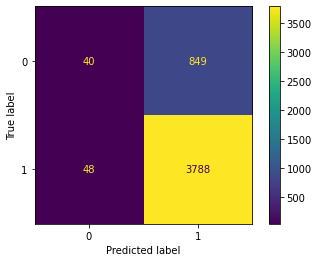

In [28]:
# Calculate the LogisticRegression
logreg = LogisticRegression(max_iter=400)
m_logreg_mm = modeling_14d.pred_eval_plot_model(X_train_trans, X_test_trans, y_train, y_test, logreg)

MinMax Scaler performed slightly (!) better than Standard Scaler.

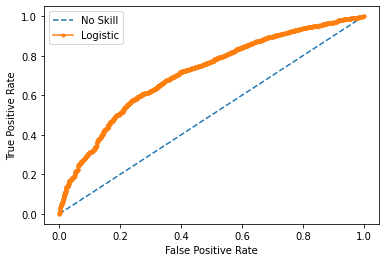

In [29]:
# predict probabilities
yhat = m_logreg_mm.predict_proba(X_test_trans)
# retrieve just the probabilities for the positive class
pos_probs = yhat[:, 1]
# plot no skill roc curve
plt.plot([0, 1], [0, 1], linestyle='--', label='No Skill')
# calculate roc curve for model
fpr, tpr, _ = roc_curve(y_test, pos_probs)
# plot model roc curve
plt.plot(fpr, tpr, marker='.', label='Logistic')
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# show the legend
plt.legend()
# show the plot
plt.show()

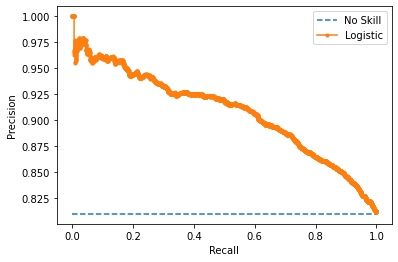

In [30]:
yhat = m_logreg_mm.predict_proba(X_test_trans)
# retrieve just the probabilities for the positive class
pos_probs = yhat[:, 1]
# calculate the no skill line as the proportion of the positive class
no_skill = len(y[y==1]) / len(y)
# plot the no skill precision-recall curve
plt.plot([0, 1], [no_skill, no_skill], linestyle='--', label='No Skill')
# calculate model precision-recall curve
precision, recall, _ = precision_recall_curve(y_test, pos_probs)
# plot the model precision-recall curve
plt.plot(recall, precision, marker='.', label='Logistic')
# axis labels
plt.xlabel('Recall')
plt.ylabel('Precision')
# show the legend
plt.legend()
# show the plot
plt.show()

In [31]:
# Classification report
y_probs = m_logreg_mm.predict_proba(X_test_trans)[:, 1]

y_pred = y_probs > 0.1
print(f"--- CLASSIFICATION REPORT {'-'*10}")
print(classification_report(y_test,y_pred))
print(f"--- CONFUSION MATRIX {'-'*10}")
print(confusion_matrix(y_test,y_pred))

--- CLASSIFICATION REPORT ----------
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       889
           1       0.81      1.00      0.90      3836

    accuracy                           0.81      4725
   macro avg       0.41      0.50      0.45      4725
weighted avg       0.66      0.81      0.73      4725

--- CONFUSION MATRIX ----------
[[   0  889]
 [   0 3836]]
/Users/Nicole/Documents/Data_Science/neuefische/projects/Capstone/stroke/Capstone/.venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/Nicole/Documents/Data_Science/neuefische/projects/Capstone/stroke/Capstone/.venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precisio

### Randomized GridSearch 

In [32]:
params_grid = {
    "penalty": ["elasticnet"],
    "C": np.logspace(-3, 3, 7),
    "max_iter": [200],
    "l1_ratio": np.arange(0, 1, 0.25),
    "solver": ["saga"],
}
rs_logreg = modeling_14d.run_rand_grid_search(X_train_trans, X_test_trans, y_train, y_test, logreg, params_grid, cv=3, n_iter=20)

Fitting 3 folds for each of 20 candidates, totalling 60 fits
[CV 1/3] END C=0.1, l1_ratio=0.25, max_iter=200, penalty=elasticnet, solver=saga; total time=   0.1s
[CV 2/3] END C=0.1, l1_ratio=0.25, max_iter=200, penalty=elasticnet, solver=saga; total time=   0.1s
[CV 3/3] END C=0.1, l1_ratio=0.25, max_iter=200, penalty=elasticnet, solver=saga; total time=   0.2s
[CV 1/3] END C=1000.0, l1_ratio=0.25, max_iter=200, penalty=elasticnet, solver=saga; total time=   0.3s
[CV 2/3] END C=1000.0, l1_ratio=0.25, max_iter=200, penalty=elasticnet, solver=saga; total time=   0.2s
[CV 3/3] END C=1000.0, l1_ratio=0.25, max_iter=200, penalty=elasticnet, solver=saga; total time=   0.7s
[CV 1/3] END C=0.1, l1_ratio=0.0, max_iter=200, penalty=elasticnet, solver=saga; total time=   0.2s
[CV 2/3] END C=0.1, l1_ratio=0.0, max_iter=200, penalty=elasticnet, solver=saga; total time=   0.2s
[CV 3/3] END C=0.1, l1_ratio=0.0, max_iter=200, penalty=elasticnet, solver=saga; total time=   0.1s
[CV 1/3] END C=100.0, l1

KeyboardInterrupt: 

+ Best model: {'solver': 'saga', 'penalty': 'elasticnet', 'max_iter': 200, 'l1_ratio': 0.0, 'C': 0.001}
+ Best cross-validated Score: 0.8085646888042097

## Decision Tree

For Decision Trees numerical data doesn't need to be scaled. Categorical data needs to be encoded. As One-Hot-Encoding leads to sparse data and decreases the performance of decision trees, we encode the categories numerically.

In [ ]:
# Encode categorical features (with more than two classes)
X_train_trans = X_train.copy()
X_test_trans = X_test.copy()
for cat in ['SEX', 'RDEF1', 'RDEF2', 'RDEF3', 'RDEF4', 'RDEF5', 'RDEF6', 'RDEF7']:
    X_train_trans[[cat]] = X_train_trans[cat].cat.codes
    X_test_trans[[cat]] = X_test_trans[cat].cat.codes

### Simple Decision Tree


In [34]:
# Define Classifier
dtree = DecisionTreeClassifier(random_state=42)

--- MODEL PARAMETERS ----------
{
    "ccp_alpha": 0.0,
    "class_weight": null,
    "criterion": "gini",
    "max_depth": null,
    "max_features": null,
    "max_leaf_nodes": null,
    "min_impurity_decrease": 0.0,
    "min_impurity_split": null,
    "min_samples_leaf": 1,
    "min_samples_split": 2,
    "min_weight_fraction_leaf": 0.0,
    "random_state": 42,
    "splitter": "best"
}
--- F1-Score ----------
0.2517321016166282
--- CLASSIFICATION REPORT ----------
              precision    recall  f1-score   support

           0       0.83      0.84      0.83      3836
           1       0.26      0.25      0.25       889

    accuracy                           0.73      4725
   macro avg       0.54      0.54      0.54      4725
weighted avg       0.72      0.73      0.72      4725

--- CONFUSION MATRIX ----------
[[3211  625]
 [ 671  218]]


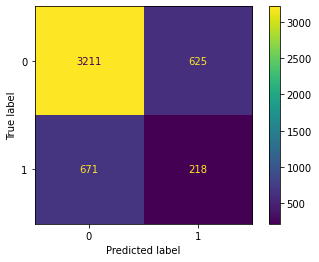

In [36]:
m_dtree = modeling_14d.pred_eval_plot_model(X_train_trans, X_test_trans, y_train, y_test, dtree)

In [ ]:
### Grid Search

In [38]:
params_grid = {
    "max_depth": np.arange(10, 50, 2),
    "min_samples_leaf": np.arange(10, 30, 2),
}
rs_dtree = modeling_14d.run_rand_grid_search(X_train_trans, X_test_trans, y_train, y_test, dtree, params_grid, n_iter=30)

Fitting 5 folds for each of 30 candidates, totalling 150 fits
[CV 1/5] END ..............max_depth=28, min_samples_leaf=20; total time=   0.0s
[CV 2/5] END ..............max_depth=28, min_samples_leaf=20; total time=   0.1s
[CV 3/5] END ..............max_depth=28, min_samples_leaf=20; total time=   0.1s
[CV 4/5] END ..............max_depth=28, min_samples_leaf=20; total time=   0.1s
[CV 5/5] END ..............max_depth=28, min_samples_leaf=20; total time=   0.0s
[CV 1/5] END ..............max_depth=12, min_samples_leaf=20; total time=   0.1s
[CV 2/5] END ..............max_depth=12, min_samples_leaf=20; total time=   0.1s
[CV 3/5] END ..............max_depth=12, min_samples_leaf=20; total time=   0.1s
[CV 4/5] END ..............max_depth=12, min_samples_leaf=20; total time=   0.0s
[CV 5/5] END ..............max_depth=12, min_samples_leaf=20; total time=   0.0s
[CV 1/5] END ..............max_depth=16, min_samples_leaf=10; total time=   0.0s
[CV 2/5] END ..............max_depth=16, min_sa

KeyboardInterrupt: 

+ Best model: {'min_samples_leaf': 28, 'max_depth': 22}
+ Best cross-validated Score: 0.8008532003242917
precision for 1 = 0.42
precision for 0 = 0.82

In [ ]:
# export the decision tree to a tree.dot file 
# for visualizing the plot easily anywhere 
export_graphviz(rs_dtree.best_estimator_, out_file ='tree.dot')

## Random Forest

In [22]:
# Encode categorical features (with more than two classes)
X_train_trans = X_train.copy()
X_test_trans = X_test.copy()
for cat in ['SEX', 'RDEF1', 'RDEF2', 'RDEF3', 'RDEF4', 'RDEF5', 'RDEF6', 'RDEF7']:
    X_train_trans[[cat]] = X_train_trans[cat].cat.codes
    X_test_trans[[cat]] = X_test_trans[cat].cat.codes

In [23]:
### Simple Random Forest

In [24]:
# Define Classifier
rf = RandomForestClassifier()

--- MODEL PARAMETERS ----------
{
    "bootstrap": true,
    "ccp_alpha": 0.0,
    "class_weight": null,
    "criterion": "gini",
    "max_depth": null,
    "max_features": "auto",
    "max_leaf_nodes": null,
    "max_samples": null,
    "min_impurity_decrease": 0.0,
    "min_impurity_split": null,
    "min_samples_leaf": 1,
    "min_samples_split": 2,
    "min_weight_fraction_leaf": 0.0,
    "n_estimators": 100,
    "n_jobs": null,
    "oob_score": false,
    "random_state": null,
    "verbose": 0,
    "warm_start": false
}
--- F1-Score ----------
0.864013883723813
--- CLASSIFICATION REPORT ----------
              precision    recall  f1-score   support

           0       0.29      0.16      0.21       889
           1       0.82      0.91      0.86      3836

    accuracy                           0.77      4725
   macro avg       0.56      0.53      0.54      4725
weighted avg       0.72      0.77      0.74      4725

--- CONFUSION MATRIX ----------
[[ 143  746]
 [ 351 3485]]


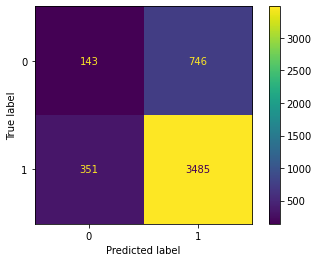

In [25]:
m_rf = modeling_14d.pred_eval_plot_model(X_train_trans, X_test_trans, y_train, y_test, rf)

+ accuracy is 77 
+ precision for 0 = 0.29
+ precision for 1 = 0.82


In [26]:
# Calculate some stats for the random forest:
n_nodes = []
max_depths = []

# Stats about the trees in random forest
for ind_tree in m_rf.estimators_:
    n_nodes.append(ind_tree.tree_.node_count)
    max_depths.append(ind_tree.tree_.max_depth)
    
print(f'Average number of nodes {int(np.mean(n_nodes))}')
print(f'Average maximum depth {int(np.mean(max_depths))}')

Average number of nodes 5109
Average maximum depth 33


### Grid Search

We want to check whether we can improve the performance of the random forest by changing the split-criterion. We will not regularize the depth of the tree and the minimum samples per leaf, as we are averaging the classification of 33 trees. Therefore, we assume that no additional regularization is necessary.

In [27]:
params_grid = {
    "criterion": ["gini", "entropy"],
}
rs_rf = modeling_14d.run_grid_search(X_train_trans, X_test_trans, y_train, y_test, rf,  params_grid)

Fitting 5 folds for each of 2 candidates, totalling 10 fits
[CV 1/5] END .................................criterion=gini; total time=   1.3s
[CV 2/5] END .................................criterion=gini; total time=   1.2s
[CV 3/5] END .................................criterion=gini; total time=   1.2s
[CV 4/5] END .................................criterion=gini; total time=   1.5s
[CV 5/5] END .................................criterion=gini; total time=   1.2s
[CV 1/5] END ..............................criterion=entropy; total time=   1.3s
[CV 2/5] END ..............................criterion=entropy; total time=   1.2s
[CV 3/5] END ..............................criterion=entropy; total time=   1.2s
[CV 4/5] END ..............................criterion=entropy; total time=   1.2s
[CV 5/5] END ..............................criterion=entropy; total time=   1.2s
--- GRID SEARCH RESULTS ----------
Best model: {'criterion': 'entropy'}
Best cross-validated Score: 0.7670114119452984
--- CLASSIF

+ accuracy 0.77
+ 0: precision 0.29, recall .16
+ 1: precision 0.82, recall 0.9

## Extra Tree
### Simple Extra Tree Classifier

In [22]:
# Encode categorical features (with more than two classes)
X_train_trans = X_train.copy()
X_test_trans = X_test.copy()
for cat in ['SEX', 'RDEF1', 'RDEF2', 'RDEF3', 'RDEF4', 'RDEF5', 'RDEF6', 'RDEF7']:
    X_train_trans[[cat]] = X_train_trans[cat].cat.codes
    X_test_trans[[cat]] = X_test_trans[cat].cat.codes

--- MODEL PARAMETERS ----------
{
    "bootstrap": false,
    "ccp_alpha": 0.0,
    "class_weight": null,
    "criterion": "gini",
    "max_depth": null,
    "max_features": "auto",
    "max_leaf_nodes": null,
    "max_samples": null,
    "min_impurity_decrease": 0.0,
    "min_impurity_split": null,
    "min_samples_leaf": 1,
    "min_samples_split": 2,
    "min_weight_fraction_leaf": 0.0,
    "n_estimators": 100,
    "n_jobs": null,
    "oob_score": false,
    "random_state": null,
    "verbose": 0,
    "warm_start": false
}
--- F1-Score ----------
0.8468789808917198
--- CLASSIFICATION REPORT ----------
              precision    recall  f1-score   support

           0       0.28      0.22      0.25       889
           1       0.83      0.87      0.85      3836

    accuracy                           0.75      4725
   macro avg       0.55      0.55      0.55      4725
weighted avg       0.72      0.75      0.73      4725

--- CONFUSION MATRIX ----------
[[ 199  690]
 [ 512 3324]]


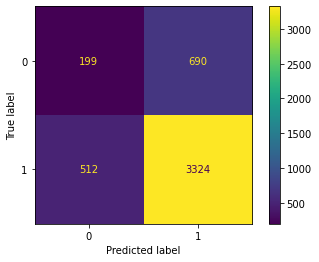

In [24]:
etree = ExtraTreesClassifier()
m_etree = modeling_14d.pred_eval_plot_model(X_train_trans, X_test_trans, y_train, y_test, etree)

+ accuracy: 75
+ 0: precision 0.28, recall 0.22
+ 1: precision 0.83, recall 0.87

## XGBoost
### Simple XGBoost

In [ ]:
# Encode categorical features (with more than two classes)
X_train_trans = X_train.copy()
X_test_trans = X_test.copy()
for cat in ['SEX', 'RDEF1', 'RDEF2', 'RDEF3', 'RDEF4', 'RDEF5', 'RDEF6', 'RDEF7']:
    X_train_trans[[cat]] = X_train_trans[cat].cat.codes
    X_test_trans[[cat]] = X_test_trans[cat].cat.codes

In [27]:
# Define Classifier
xgb = XGBClassifier()

/Users/Nicole/Documents/Data_Science/neuefische/projects/Capstone/stroke/Capstone/.venv/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
[18:03:58] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
--- MODEL PARAMETERS ----------
{
    "objective": "binary:logistic",
    "use_label_encoder": true,
    "base_score": 0.5,
    "booster": "gbtree",
    "colsample_bylevel": 1,
    "colsample_

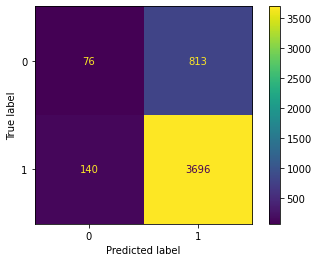

In [28]:
m_xgb = modeling_14d.pred_eval_plot_model(X_train_trans, X_test_trans, y_train, y_test, xgb)

In [ ]:
+ accuracy .8
+ 0: precision 0.35, recall 0.09
+ 1: precision 0.82, recall 0.96

## K-Means

In [ ]:
# Define transformer
transformer = ColumnTransformer([
    ("scale", mms, num_cols),
    ("encode", onehot, cat_cols),
])

# Transform
X_train_trans = transformer.fit_transform(X_train)
X_test_trans = transformer.transform(X_test)

In [264]:
pca_ = PCA(n_components=2, random_state=42)
X_train_pca = pca_.fit_transform(X_train_trans)

In [265]:
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=150, n_init=10, random_state=42)
    kmeans.fit(X_train_pca)
    wcss.append(kmeans.inertia_)

In [268]:
# Creating the KMeans Clustering model and fit it to our data X_pca after Dimensionality Reduction
kmeans = KMeans(n_clusters= 2, verbose=0, init='k-means++', max_iter=150, n_init=50, random_state=0)
kmeans.fit(X_train_pca)


KMeans(max_iter=150, n_clusters=2, n_init=50, random_state=0)

In [269]:
ari_kmeans = adjusted_rand_score(y_train, kmeans.labels_)
ari_kmeans

0.08147693893980999

In [270]:
# Create new dataframe with real and predicted labels 
df_res_kmeans = pd.DataFrame()
df_res_kmeans['PC1'] = X_train_pca[:, 0]
df_res_kmeans['PC2'] = X_train_pca[:, 1]
df_res_kmeans['org_target'] = y_train
#df_res_kmeans['true_label'] = label_encoder.inverse_transform(y_train)
df_res_kmeans['pred_target'] = kmeans.labels_
df_res_kmeans.head()

,PC1,PC2,org_target,pred_target
0,0.167799,0.348168,False,1
1,1.133863,0.150261,False,1
2,-0.968243,-0.324429,False,0
3,-0.597549,-0.480771,False,0
4,-0.734864,0.230787,False,0


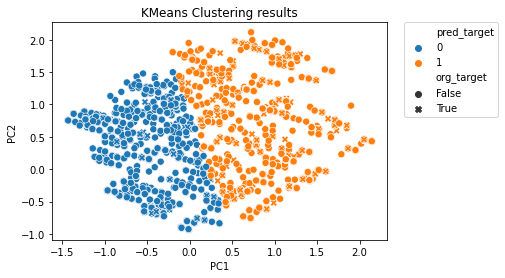

In [271]:
scat = sns.scatterplot(
    x = 'PC1',
    y = 'PC2',
    s=50,
    data=df_res_kmeans ,
    hue="pred_target",
    style="org_target",
)

scat.set_title(
    "KMeans Clustering results"
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.show()

In [272]:
print(df_res_kmeans.org_target.unique())
print(df_res_kmeans.pred_target.unique())

[False  True]
[1 0]


In [273]:
# Since we know the correct lables we can also evaluate the performance of the algorithm
print(confusion_matrix(y_train,kmeans.labels_))
print(classification_report(y_train,kmeans.labels_))

[[6178 2734]
 [ 939 1171]]
              precision    recall  f1-score   support

       False       0.87      0.69      0.77      8912
        True       0.30      0.55      0.39      2110

    accuracy                           0.67     11022
   macro avg       0.58      0.62      0.58     11022
weighted avg       0.76      0.67      0.70     11022



87% patients correctly predicted as 'not recovered', 30% patients correctly predicted as 'recovered'

### MiniBatch KMeans

In [286]:
pca_ = PCA(n_components=2, random_state=42)
X_train_pca = pca_.fit_transform(X_train_trans)

In [287]:
# Creating the MiniBatchKMeans Clustering model and fit it to our preprocessed data
batch_kmeans = MiniBatchKMeans(n_clusters=2, verbose=0, max_iter=150, n_init=20, random_state=0)
batch_kmeans.fit(X_train_pca)

MiniBatchKMeans(max_iter=150, n_clusters=2, n_init=20, random_state=0)

In [288]:
ari_batch_kmeans = adjusted_rand_score(y_train, batch_kmeans.labels_)
ari_batch_kmeans

0.08139010563469727

In [289]:
# Create new dataframe with real and predicted labels 
df_res_batch_kmeans = pd.DataFrame()
df_res_batch_kmeans['PC1'] = X_train_pca[:, 0]
df_res_batch_kmeans['PC2'] = X_train_pca[:, 1]
df_res_batch_kmeans['org_target'] = y_train
#df_res_batch_kmeans['true_label'] = label_encoder.inverse_transform(y_train)
df_res_batch_kmeans['pred_cluster'] = batch_kmeans.labels_
df_res_batch_kmeans.head()

,PC1,PC2,org_target,pred_cluster
0,0.167799,0.348168,False,1
1,1.133863,0.150261,False,1
2,-0.968243,-0.324429,False,0
3,-0.597549,-0.480771,False,0
4,-0.734864,0.230787,False,0


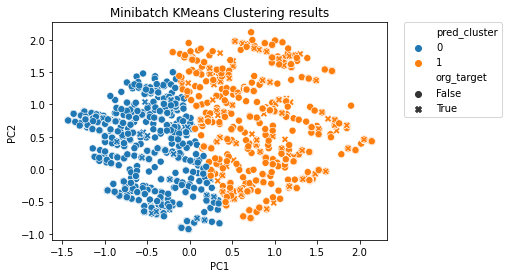

In [290]:
scat = sns.scatterplot(
    x = 'PC1',
    y = 'PC2',
    s=50,
    data=df_res_batch_kmeans ,
    hue="pred_cluster",
    style="org_target",
)

scat.set_title(
    "Minibatch KMeans Clustering results"
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.show()

In [291]:
# Since we know the correct lables we can also evaluate the performance of the algorithm
print(confusion_matrix(y_train,batch_kmeans.labels_))
print(classification_report(y_train,batch_kmeans.labels_))

[[6177 2735]
 [ 939 1171]]
              precision    recall  f1-score   support

       False       0.87      0.69      0.77      8912
        True       0.30      0.55      0.39      2110

    accuracy                           0.67     11022
   macro avg       0.58      0.62      0.58     11022
weighted avg       0.76      0.67      0.70     11022



Exact result as "K-Means".

### Agglomerative Clustering

In [311]:
pca_ = PCA(n_components=3, random_state=42)
X_train_pca = pca_.fit_transform(X_train_trans)

In [312]:
# Creating the AgglomerativeClustering model and fit it to our preprocessed data
agg_clust = AgglomerativeClustering(n_clusters=2, linkage='ward').fit(X_train_pca)

In [313]:
ari_agg_clust = adjusted_rand_score(y_train, agg_clust.labels_)
ari_agg_clust

0.10088625904657593

In [314]:
# Create new dataframe with real and predicted labels 
df_res_agg_clust = pd.DataFrame()
df_res_agg_clust ['PC1'] = X_train_pca[:, 0]
df_res_agg_clust ['PC2'] = X_train_pca[:, 1]
df_res_agg_clust ['org_target'] = y_train
#df_res_agg_clust ['true_label'] = label_encoder.inverse_transform(y_train)
df_res_agg_clust ['pred_cluster'] = agg_clust.labels_
df_res_agg_clust.head()

,PC1,PC2,org_target,pred_cluster
0,0.167799,0.348168,False,0
1,1.133863,0.150261,False,1
2,-0.968243,-0.324429,False,0
3,-0.597550,-0.480772,False,0
4,-0.734864,0.230785,False,0


In [315]:
# Since we know the correct lables we can also evaluate the performance of the algorithm
print(confusion_matrix(y_train,agg_clust.labels_))
print(classification_report(y_train,agg_clust.labels_))

[[7688 1224]
 [1509  601]]
              precision    recall  f1-score   support

       False       0.84      0.86      0.85      8912
        True       0.33      0.28      0.31      2110

    accuracy                           0.75     11022
   macro avg       0.58      0.57      0.58     11022
weighted avg       0.74      0.75      0.75     11022



84% 'not recovered' get predicted as such, 33% 'recovered' get predicted as such

### DBSCAN


In [316]:
pca_ = PCA(n_components=6, random_state=42)
X_train_pca = pca_.fit_transform(X_train_trans)

In [317]:
db_clust = DBSCAN(eps = 0.05, min_samples = 200).fit(X_train_pca)

In [318]:
ari_db_clust = adjusted_rand_score(y_train, db_clust.labels_)
ari_db_clust

0.03752123053870509

In [319]:
pd.DataFrame(db_clust.labels_)[0].unique()

array([-1,  0,  1,  2,  3,  4,  5,  6])

## PCA-Plot


In [340]:
labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca_.explained_variance_ratio_ * 100)
}

fig = px.scatter_matrix(
    X_train_pca,
    labels=labels,
    dimensions=range(4),
    color=y_train
)
fig.update_traces(diagonal_visible=False)
fig.show()

In [342]:
total_var = pca_.explained_variance_ratio_.sum() * 100

fig = px.scatter_3d(
    X_train_pca, x=0, y=1, z=2, color=y_train,
    title=f'Total Explained Variance: {total_var:.2f}%',
    labels={'0': 'PC 1', '1': 'PC 2', '2': 'PC 3'}
)
fig.show()

In [344]:
loadings = pca_.components_.T * np.sqrt(pca_.explained_variance_)

fig = px.scatter(X_train_pca, x=0, y=1, color=y_train)

for i, feature in enumerate(features):
    fig.add_shape(
        type='line',
        x0=0, y0=0,
        x1=loadings[i, 0],
        y1=loadings[i, 1]
    )
    fig.add_annotation(
        x=loadings[i, 0],
        y=loadings[i, 1],
        ax=0, ay=0,
        xanchor="center",
        yanchor="bottom",
        text=feature,
    )
fig.show()

NCB14 and SEX don't seem to have a great effect. Kick out and try again.

In [367]:
# Select features
features = ['AGE', 'RSBP', 'RDEF1', 'RDEF2', 'RDEF3', 'RDEF4', 'RDEF5', 'RDEF6', 'RDEF7', 'STRK14']
X = df[features]

# Select target (only 'recovered' versus other states)
#y = (df.OCCODE)
y = (df.OCCODE == 'Recovered')

In [368]:
# Split the data in test and training set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [369]:
#convert all 'objects' into 'categories'
X_train = pd.concat([
        X_train.select_dtypes([], ['object']),
        X_train.select_dtypes(['object']).apply(pd.Series.astype, dtype='category')
        ], axis=1).reindex(X_train.columns, axis=1)
X_train.index = pd.RangeIndex(len(X_train.index))

In [370]:
#convert all 'objects' into 'categories'
X_test = pd.concat([
        X_test.select_dtypes([], ['object']),
        X_test.select_dtypes(['object']).apply(pd.Series.astype, dtype='category')
        ], axis=1).reindex(X_test.columns, axis=1)
X_test.index = pd.RangeIndex(len(X_test.index))

In [371]:
y_train.index = pd.RangeIndex(len(y_train.index))
y_test.index = pd.RangeIndex(len(y_test.index))

In [372]:
X_train_trans2 = transformer.fit_transform(X_train)
X_test_trans2 = transformer.transform(X_test)

## KMeans

In [373]:
pca2 = PCA(n_components=2, random_state=42)
X_train_pca2 = pca2.fit_transform(X_train_trans2)

In [374]:
# Creating the KMeans Clustering model and fit it to our data X_pca after Dimensionality Reduction
kmeans2 = KMeans(n_clusters= 2, verbose=0, init='k-means++', max_iter=150, n_init=50, random_state=0)
kmeans2.fit(X_train_pca2)

KMeans(max_iter=150, n_clusters=2, n_init=50, random_state=0)

In [375]:
ari_kmeans2 = adjusted_rand_score(y_train, kmeans2.labels_)
ari_kmeans2

0.08104328698014347

In [376]:
# Since we know the correct lables we can also evaluate the performance of the algorithm
print(confusion_matrix(y_train,kmeans2.labels_))
print(classification_report(y_train,kmeans2.labels_))

[[2739 6173]
 [1171  939]]
              precision    recall  f1-score   support

       False       0.70      0.31      0.43      8912
        True       0.13      0.45      0.20      2110

    accuracy                           0.33     11022
   macro avg       0.42      0.38      0.32     11022
weighted avg       0.59      0.33      0.38     11022



## Agglomerative Clustering

In [378]:
pca2 = PCA(n_components=2, random_state=42)
X_train_pca2 = pca2.fit_transform(X_train_trans2)

In [379]:
# Creating the AgglomerativeClustering model and fit it to our preprocessed data
agg_clust2 = AgglomerativeClustering(n_clusters=2, linkage='ward').fit(X_train_pca2)

In [380]:
ari_agg_clust2 = adjusted_rand_score(y_train, agg_clust2.labels_)
ari_agg_clust2

0.09728236389136433

In [381]:
# Since we know the correct lables we can also evaluate the performance of the algorithm
print(confusion_matrix(y_train,agg_clust2.labels_))
print(classification_report(y_train,agg_clust2.labels_))


[[7591 1321]
 [1484  626]]
              precision    recall  f1-score   support

       False       0.84      0.85      0.84      8912
        True       0.32      0.30      0.31      2110

    accuracy                           0.75     11022
   macro avg       0.58      0.57      0.58     11022
weighted avg       0.74      0.75      0.74     11022



Kicking out 'NCB14' and 'SEX' does not improve the models.

## Tensorflow Projector

In [330]:
# Set up a logs directory, so Tensorboard knows where to look for files
log_dir='data/logs/agg_cluster/'

# Save Labels separately on a line-by-line manner.
with open(os.path.join(log_dir, 'metadata.tsv'), "w") as f:
  for labels in X_train_pca:
    f.write("{}\n".format(labels))


In [332]:

# Save the weights we want to analyse as a variable. Note that the first
# value represents any unknown word, which is not in the metadata, so
# we will remove that value.
weights = tf.Variable(pca_.layers.get_weights()[0][0:])
# Create a checkpoint from embedding, the filename and key are
# name of the tensor.
checkpoint = tf.train.Checkpoint(embedding=weights)
checkpoint.save(os.path.join(log_dir, "embedding.ckpt"))



AttributeError: 'PCA' object has no attribute 'layers'

In [ ]:
# Set up config
config = projector.ProjectorConfig()
embedding = config.embeddings.add()
# The name of the tensor will be suffixed by `/.ATTRIBUTES/VARIABLE_VALUE`
embedding.tensor_name = "embedding/.ATTRIBUTES/VARIABLE_VALUE"
embedding.metadata_path = 'metadata.tsv'
projector.visualize_embeddings(log_dir, config)